In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt 

In [2]:
train_data=pd.read_csv("/Users/rohansridhar/Desktop/SATELLITE/SATELLITE-IMAGERY/PREDICT_SPEED_POSITION/jan_train.csv")
test_data=pd.read_csv("/Users/rohansridhar/Desktop/SATELLITE/SATELLITE-IMAGERY/PREDICT_SPEED_POSITION/jan_test.csv")
validation_data=pd.read_csv('/Users/rohansridhar/Desktop/SATELLITE/SATELLITE-IMAGERY/PREDICT_SPEED_POSITION/answer_key.csv')

In [3]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 503227 entries, 0 to 503226
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      503227 non-null  int64  
 1   epoch   503227 non-null  object 
 2   sat_id  503227 non-null  int64  
 3   x       503227 non-null  float64
 4   y       503227 non-null  float64
 5   z       503227 non-null  float64
 6   Vx      503227 non-null  float64
 7   Vy      503227 non-null  float64
 8   Vz      503227 non-null  float64
 9   x_sim   503227 non-null  float64
 10  y_sim   503227 non-null  float64
 11  z_sim   503227 non-null  float64
 12  Vx_sim  503227 non-null  float64
 13  Vy_sim  503227 non-null  float64
 14  Vz_sim  503227 non-null  float64
dtypes: float64(12), int64(2), object(1)
memory usage: 57.6+ MB


In [4]:
train_data.head()

,id,epoch,sat_id,x,y,z,Vx,Vy,Vz,x_sim,y_sim,z_sim,Vx_sim,Vy_sim,Vz_sim
0,0,2014-01-01 00:00:00.000,0,-8855.823863,13117.780146,-20728.353233,-0.908303,-3.808436,-2.022083,-8843.131454,13138.221690,-20741.615306,-0.907527,-3.804930,-2.024133
1,1,2014-01-01 00:46:43.000,0,-10567.672384,1619.746066,-24451.813271,-0.302590,-4.272617,-0.612796,-10555.500066,1649.289367,-24473.089556,-0.303704,-4.269816,-0.616468
2,2,2014-01-01 01:33:26.001,0,-10578.684043,-10180.467460,-24238.280949,0.277435,-4.047522,0.723155,-10571.858472,-10145.939908,-24271.169776,0.274880,-4.046788,0.718768
3,3,2014-01-01 02:20:09.001,0,-9148.251857,-20651.437460,-20720.381279,0.715600,-3.373762,1.722115,-9149.620794,-20618.200201,-20765.019094,0.712437,-3.375202,1.718306
4,4,2014-01-01 03:06:52.002,0,-6719.092336,-28929.061629,-14938.907967,0.992507,-2.519732,2.344703,-6729.358857,-28902.271436,-14992.399986,0.989382,-2.522618,2.342237


In [5]:
train_data['epoch']=pd.to_datetime(train_data['epoch'])
train_data.head()


,id,epoch,sat_id,x,y,z,Vx,Vy,Vz,x_sim,y_sim,z_sim,Vx_sim,Vy_sim,Vz_sim
0,0,2014-01-01 00:00:00.000,0,-8855.823863,13117.780146,-20728.353233,-0.908303,-3.808436,-2.022083,-8843.131454,13138.221690,-20741.615306,-0.907527,-3.804930,-2.024133
1,1,2014-01-01 00:46:43.000,0,-10567.672384,1619.746066,-24451.813271,-0.302590,-4.272617,-0.612796,-10555.500066,1649.289367,-24473.089556,-0.303704,-4.269816,-0.616468
2,2,2014-01-01 01:33:26.001,0,-10578.684043,-10180.467460,-24238.280949,0.277435,-4.047522,0.723155,-10571.858472,-10145.939908,-24271.169776,0.274880,-4.046788,0.718768
3,3,2014-01-01 02:20:09.001,0,-9148.251857,-20651.437460,-20720.381279,0.715600,-3.373762,1.722115,-9149.620794,-20618.200201,-20765.019094,0.712437,-3.375202,1.718306
4,4,2014-01-01 03:06:52.002,0,-6719.092336,-28929.061629,-14938.907967,0.992507,-2.519732,2.344703,-6729.358857,-28902.271436,-14992.399986,0.989382,-2.522618,2.342237


In [6]:
#spliting the data 
x=train_data[['id','sat_id','x_sim','y_sim','z_sim','Vx_sim','Vy_sim','Vz_sim']].copy()
y=train_data[['x','y','z','Vx','Vy','Vz']]

In [7]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()   
x=scaler.fit_transform(x) 

In [8]:
from sklearn.model_selection import train_test_split 
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [9]:
import xgboost as xgb 
model = xgb.XGBRegressor() 
model.fit(x_train,y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [10]:
model.score(x_test,y_test)

0.9678580410399946

In [11]:
test_data=test_data[['id','sat_id','x_sim','y_sim','z_sim','Vx_sim','Vy_sim','Vz_sim']].copy()
test_data_scale=scaler.fit_transform(test_data)

In [12]:
model.score(test_data_scale,validation_data)

0.80948293537472

In [13]:
import pickle 
filename='Predict_position_speed.pkl'
pickle.dump(model,open(filename,'wb'))

In [14]:
loaded_model=pickle.load(open(filename,'rb'))

In [15]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import seaborn as sns

# Evaluate the model
y_pred = loaded_model.predict(x_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print evaluation metrics
print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("R-squared (R^2) Score:", r2)




Mean Absolute Error: 934.9805499674916
Mean Squared Error: 6932743.906503081
R-squared (R^2) Score: 0.9678580410399946


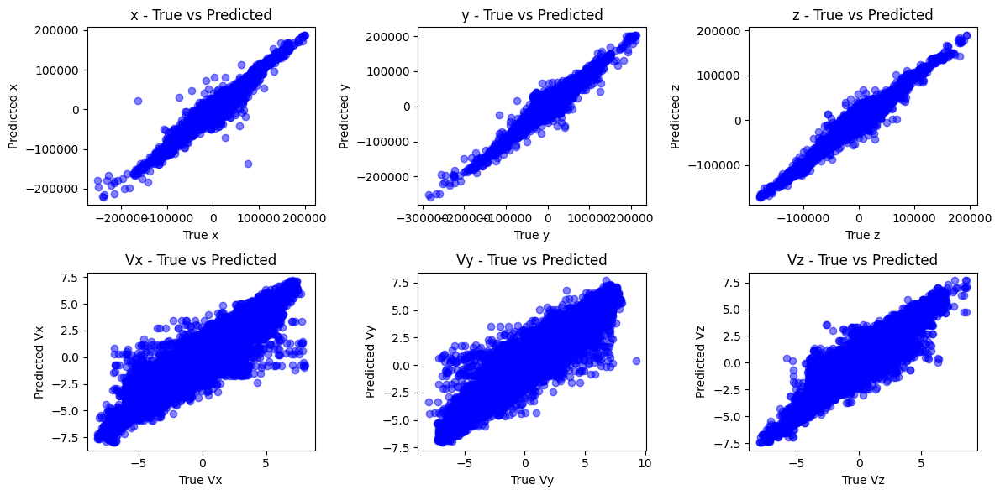

In [16]:
# Create scatter plots for each target variable
plt.figure(figsize=(12, 6))
for i, col in enumerate(y_test.columns):
    plt.subplot(2, 3, i+1)
    plt.scatter(y_test[col], y_pred[:, i], color='blue', alpha=0.5)
    plt.xlabel("True " + col)
    plt.ylabel("Predicted " + col)
    plt.title(col + " - True vs Predicted")
plt.tight_layout()
plt.show()

In [17]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

# Function to calculate Euclidean distance between two points in 3D space
def euclidean_distance(x1, y1, z1, x2, y2, z2):
    return np.sqrt((x2 - x1)**2 + (y2 - y1)**2 + (z2 - z1)**2)


In [18]:
#Calculate Euclidean distance between each pair of satellites
train_data['euclidean_distance'] = euclidean_distance(train_data['x_sim'], train_data['y_sim'], train_data['z_sim'],
                                                       train_data['x_sim'].shift(), train_data['y_sim'].shift(), train_data['z_sim'].shift())

# Define threshold for collision
collision_threshold = 7500.00 

In [19]:

# Create labels for collision occurrences based on proximity
train_data['actual_collision_label'] = (train_data['euclidean_distance'] < collision_threshold).astype(int)

train_data=train_data.drop(columns=['id','epoch'],axis=1)


In [36]:
train_data.head()

,sat_id,x,y,z,Vx,Vy,Vz,x_sim,y_sim,z_sim,Vx_sim,Vy_sim,Vz_sim,euclidean_distance,actual_collision_label
0,0,-8855.823863,13117.780146,-20728.353233,-0.908303,-3.808436,-2.022083,-8843.131454,13138.221690,-20741.615306,-0.907527,-3.804930,-2.024133,7567.697710,0
1,0,-10567.672384,1619.746066,-24451.813271,-0.302590,-4.272617,-0.612796,-10555.500066,1649.289367,-24473.089556,-0.303704,-4.269816,-0.616468,12200.478362,0
2,0,-10578.684043,-10180.467460,-24238.280949,0.277435,-4.047522,0.723155,-10571.858472,-10145.939908,-24271.169776,0.274880,-4.046788,0.718768,11796.968799,0
3,0,-9148.251857,-20651.437460,-20720.381279,0.715600,-3.373762,1.722115,-9149.620794,-20618.200201,-20765.019094,0.712437,-3.375202,1.718306,11134.814245,0
4,0,-6719.092336,-28929.061629,-14938.907967,0.992507,-2.519732,2.344703,-6729.358857,-28902.271436,-14992.399986,0.989382,-2.522618,2.342237,10382.997421,0


In [21]:
# Check for missing values
print(train_data.isna().sum())

sat_id                    0
x                         0
y                         0
z                         0
Vx                        0
Vy                        0
Vz                        0
x_sim                     0
y_sim                     0
z_sim                     0
Vx_sim                    0
Vy_sim                    0
Vz_sim                    0
euclidean_distance        1
actual_collision_label    0
dtype: int64


In [22]:
# Impute missing values with mean
train_data.fillna(train_data.mean(), inplace=True)

In [23]:
# Preprocess data
features = train_data[['x_sim', 'y_sim', 'z_sim', 'Vx_sim', 'Vy_sim', 'Vz_sim', 'euclidean_distance']]
target = train_data['actual_collision_label']

In [24]:
#Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.3, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [33]:
X_train_scaled

array([[-5.92608893e-01,  1.46694678e-01, -7.41822105e-01, ...,
         1.55623227e+00, -2.30320668e-01, -7.01965050e-02],
       [ 1.17594896e+00,  3.70920993e-01, -3.89596625e-02, ...,
        -1.26324673e+00, -2.24578345e-02, -1.65665994e-01],
       [ 2.56284344e-01,  5.77333532e-01,  4.93952161e-01, ...,
         9.27841934e-02, -1.25035063e-03, -1.76639437e-01],
       ...,
       [-5.84287783e-01,  4.24872750e-01,  1.91930058e+00, ...,
         7.03848949e-01, -3.11689970e-01, -5.25151155e-01],
       [-1.43438915e+00, -3.09154249e+00, -8.51040978e-01, ...,
        -3.83115461e-01,  1.37574418e-01,  6.69267602e-01],
       [ 7.42162091e-02, -2.96787975e-01,  7.45942747e-01, ...,
        -1.94979827e+00,  3.61590255e-01, -1.95215448e-01]])

In [34]:
X_test_scaled

array([[ 0.16793866,  0.90972839,  0.4003319 , ...,  0.66877892,
        -1.02531001, -0.59802569],
       [-1.9557312 ,  2.64094289, -2.34261676, ...,  0.64124375,
        -0.17258636,  1.50769322],
       [-2.12190086, -0.99584206,  0.00951456, ..., -0.55127446,
         0.15426118, -0.53149752],
       ...,
       [ 0.26159428,  0.2140639 , -0.67396173, ...,  1.93475788,
        -0.01730794, -0.43362677],
       [-1.16415315,  0.40390074,  0.33777042, ...,  1.14746623,
         0.1310058 , -0.34774022],
       [-1.44936469, -0.63461627, -0.34830583, ...,  0.62468207,
        -1.21271038,  0.63209507]])

In [25]:
# Train a Random Forest classifier (or any other suitable classifier)
model = RandomForestClassifier()
model.fit(X_train_scaled, y_train)


RandomForestClassifier()

In [26]:
# Evaluate the model
train_accuracy = model.score(X_train_scaled, y_train)
test_accuracy = model.score(X_test_scaled, y_test)
print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 1.0
Testing Accuracy: 0.9999933761235751


In [27]:
predictions = model.predict(X_test_scaled)

In [28]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(predictions, y_test)
print("Accuracy:", accuracy)

Accuracy: 0.9999933761235751


In [29]:
# Determine potential collisions based on the threshold
potential_collisions = [distance < collision_threshold for distance in train_data['euclidean_distance']]

# Print potential collisions
print("Potential Collisions:")
for i, is_collision in enumerate(potential_collisions, start=1):
    print(f"Satellite {i}: {'Yes' if is_collision else 'No'}")

Potential Collisions:
Satellite 1: No
Satellite 2: No
Satellite 3: No
Satellite 4: No
Satellite 5: No
Satellite 6: No
Satellite 7: No
Satellite 8: No
Satellite 9: No
Satellite 10: No
Satellite 11: Yes
Satellite 12: Yes
Satellite 13: Yes
Satellite 14: Yes
Satellite 15: Yes
Satellite 16: Yes
Satellite 17: No
Satellite 18: No
Satellite 19: No
Satellite 20: No
Satellite 21: No
Satellite 22: No
Satellite 23: No
Satellite 24: No
Satellite 25: No
Satellite 26: No
Satellite 27: No
Satellite 28: No
Satellite 29: No
Satellite 30: No
Satellite 31: No
Satellite 32: No
Satellite 33: No
Satellite 34: No
Satellite 35: Yes
Satellite 36: Yes
Satellite 37: Yes
Satellite 38: Yes
Satellite 39: Yes
Satellite 40: Yes
Satellite 41: No
Satellite 42: No
Satellite 43: No
Satellite 44: No
Satellite 45: No
Satellite 46: No
Satellite 47: No
Satellite 48: No
Satellite 49: No
Satellite 50: No
Satellite 51: No
Satellite 52: No
Satellite 53: No
Satellite 54: No
Satellite 55: No
Satellite 56: No
Satellite 57: No
Satell

In [30]:
import pickle 
filename='Predict_Collision.pkl'
pickle.dump(model,open(filename,'wb'))

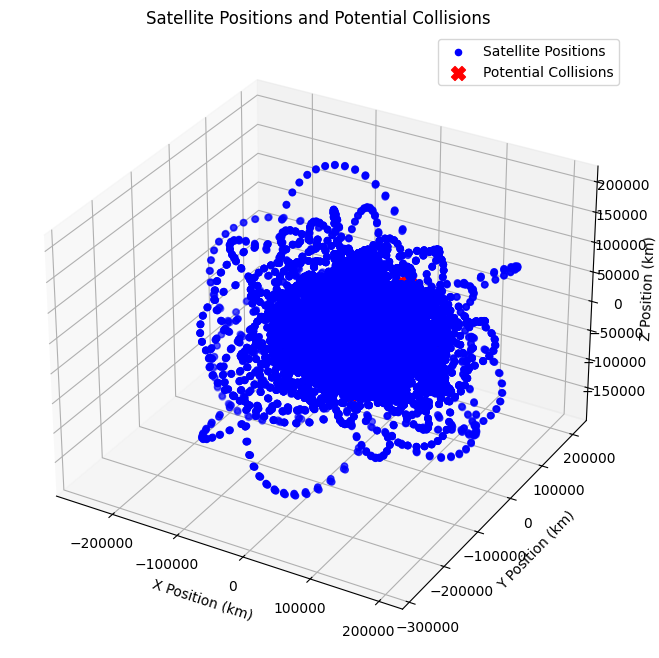

In [31]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Extracting coordinates of satellites
x = train_data['x_sim']
y = train_data['y_sim']
z = train_data['z_sim']

# Create 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot satellite positions
ax.scatter(x, y, z, c='b', marker='o', label='Satellite Positions')

# Highlight potential collisions
potential_collisions_indices = [i for i, is_collision in enumerate(potential_collisions) if is_collision]
ax.scatter(x[potential_collisions_indices], y[potential_collisions_indices], z[potential_collisions_indices], c='r', marker='X', s=100, label='Potential Collisions')

# Set plot labels and legend
ax.set_xlabel('X Position (km)')
ax.set_ylabel('Y Position (km)')
ax.set_zlabel('Z Position (km)')
ax.set_title('Satellite Positions and Potential Collisions')
ax.legend()

plt.show()


In [37]:
# Define the feature values
feature_values = [[-8843.131454, 13138.221690, -20741.615306, -0.907527, -3.804930, -2.024133, 7567.697710]]

# Transform the feature values using the scaler
scaled_feature_values = scaler.transform(feature_values)

# Print the scaled feature values
print("Scaled feature values:")
print(scaled_feature_values)


Scaled feature values:
[[-3.12848444e-01  5.01345402e-01 -1.00048567e+00 -3.43694488e-01
  -1.46545109e+00 -9.57490233e-01 -2.10703428e-05]]


/Users/rohansridhar/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
